In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from PIL import Image
import os

### Problem 1: Constant k 

In [74]:
# Laplacian high-pass filter as specified in the assignment
laplacian_kernel = np.array([[-1, -1, -1],
                             [-1,  8, -1],
                             [-1, -1, -1]])


def sharpenAdjust(img, k):
    convolved_img = convolve(img.astype(np.float64), laplacian_kernel)
    sharpened = img.astype(np.float64) + k * convolved_img
    return np.clip(sharpened, 0, 255).astype(np.uint8)

In [6]:
# Load images
img_dir = "imagesforA11"
img_files = sorted(os.listdir(img_dir))
img_files = [f for f in img_files if f.endswith(('.png', '.jpeg', '.jpg'))]

images = {}
for f in img_files:
    img = np.array(Image.open(os.path.join(img_dir, f)))
    images[f] = img

image_names = list(images.keys())

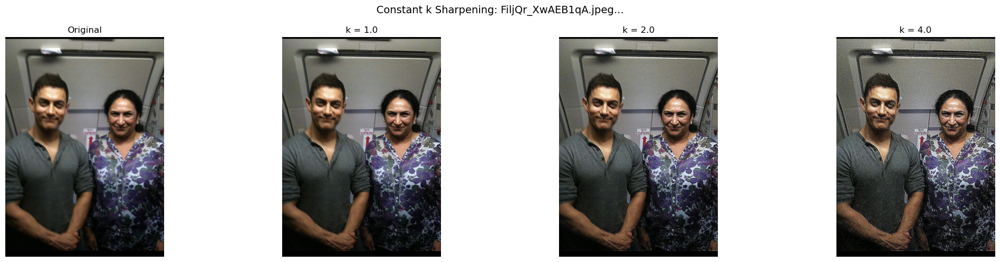

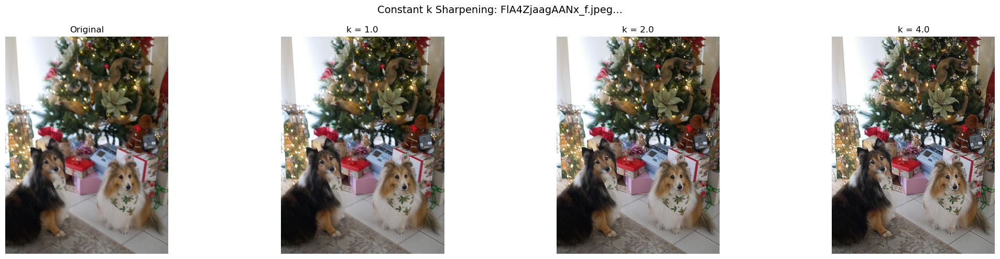

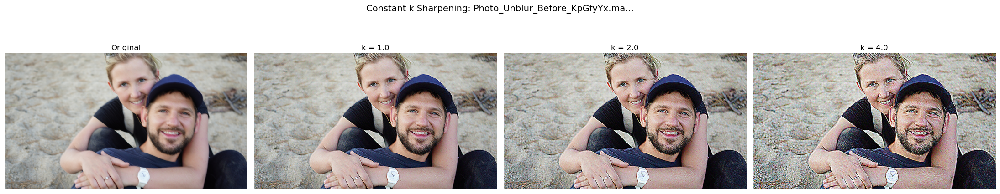

In [14]:
# Sharpen all images with different constant k values
k_values = [1.0, 2.0, 4.0]

for name in image_names:
    img = images[name]
    fig, axes = plt.subplots(1, 4, figsize=(22, 5))

    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis('off')

    for j, k in enumerate(k_values):
        # Apply sharpenAdjust per channel for color images
        if img.ndim == 3:
            sharpened = np.stack([sharpenAdjust(img[:, :, c], k) for c in range(img.shape[2])], axis=2)
        else:
            sharpened = sharpenAdjust(img, k)

        axes[j + 1].imshow(sharpened)
        axes[j + 1].set_title(f"k = {k}")
        axes[j + 1].axis('off')

    plt.suptitle(f"Constant k Sharpening: {name[:30]}...", fontsize=14)
    plt.tight_layout()
    plt.show()

### Problem 2: Variable k

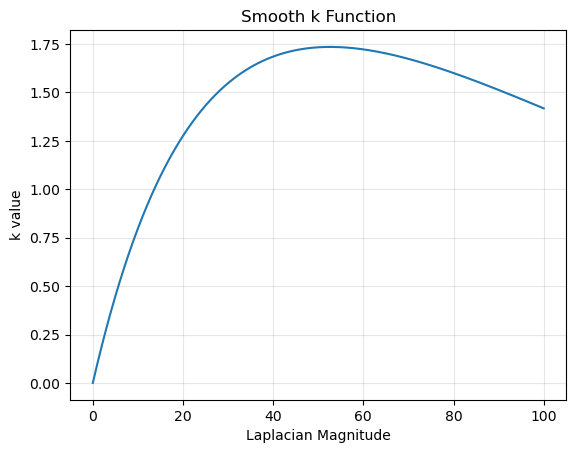

In [72]:
def smooth_k(convolved_img, k_max = 7.5):
    """
    Smooth adaptive gain using sigmoid + exponential decay.
    Takes the convolved (Laplacian-filtered) image and returns a spatially varying k_map.
    """
    absL = np.abs(convolved_img)

    sigma = np.median(absL) / 0.6745 if np.median(absL) > 0 else 1e-6

    T1 = sigma
    T2 = np.percentile(absL, 90) + 1e-6

    k_map = k_max * (absL / (absL + T1)) * np.exp(-absL / T2)

    return k_map

x = np.linspace(0, 100, 500)
k_piece = smooth_k(x)

plt.figure()
plt.plot(x, k_piece)
plt.xlabel("Laplacian Magnitude")
plt.ylabel("k value")
plt.title("Smooth k Function")
plt.grid(True, alpha=0.3)
plt.show()


def sharpenAdjust_variable(img, k_max):
    """
    High-boost filtering with spatially varying k.
    Uses smooth_k to compute the k_map from the convolved image.
    """
    convolved_img = convolve(img.astype(np.float64), laplacian_kernel)
    k_map = smooth_k(convolved_img, k_max)

    sharpened = img.astype(np.float64) + k_map * convolved_img
    return np.clip(sharpened, 0, 255).astype(np.uint8), k_map, convolved_img

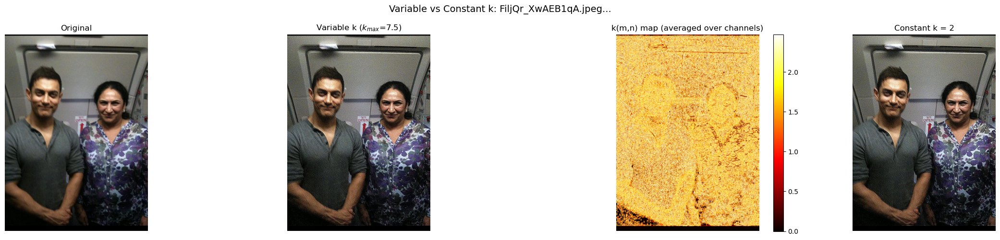

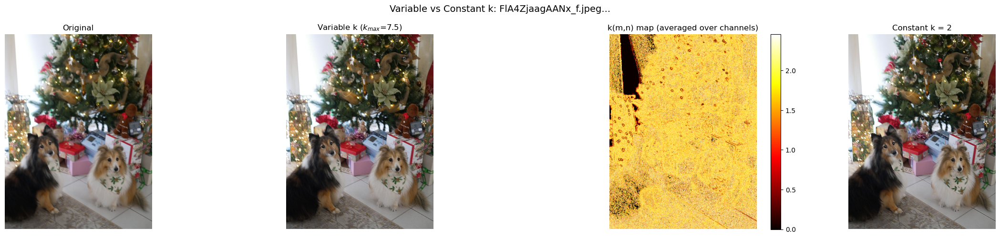

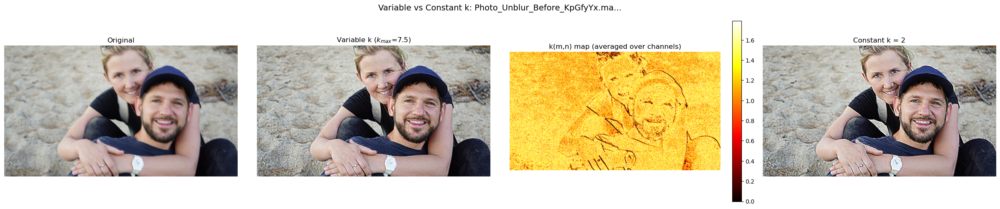

In [71]:
# Apply variable k sharpening and show the k-map for one channel
k_max = 7.5
k_constant = 2

for name in image_names:
    img = images[name]
    fig, axes = plt.subplots(1, 4, figsize=(24, 5))

    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis('off')

    if img.ndim == 3:
        sharpened_channels = []
        k_map_avg = np.zeros(img.shape[:2])
        for c in range(img.shape[2]):
            sh, km, _ = sharpenAdjust_variable(img[:, :, c], k_max)
            sharpened_channels.append(sh)
            k_map_avg += km
        sharpened_var = np.stack(sharpened_channels, axis=2)
        k_map_avg /= img.shape[2]
    else:
        sharpened_var, k_map_avg, _ = sharpenAdjust_variable(img, k_max)

    axes[1].imshow(sharpened_var)
    axes[1].set_title(f"Variable k ($k_{{max}}$={k_max})")
    axes[1].axis('off')

    # Show the spatially varying k map
    im = axes[2].imshow(k_map_avg, cmap='hot')
    axes[2].set_title("k(m,n) map (averaged over channels)")
    axes[2].axis('off')
    plt.colorbar(im, ax=axes[2], fraction=0.046)

    # Show constant k result for comparison (same k_max)
    if img.ndim == 3:
        sharpened_const = np.stack([sharpenAdjust(img[:, :, c], k_constant) for c in range(img.shape[2])], axis=2)
    else:
        sharpened_const = sharpenAdjust(img, k_constant)

    axes[3].imshow(sharpened_const)
    axes[3].set_title(f"Constant k = {k_constant}")
    axes[3].axis('off')

    plt.suptitle(f"Variable vs Constant k: {name[:30]}...", fontsize=14)
    plt.tight_layout()
    plt.show()